# 👨‍🎨🤵‍♀️🧑‍🎤 Problem 2: Generative Adversarial Network
In this problem, we will train a generative adversarial network (GAN) to generate new celebrities after showing it pictures of many real celebrities.

In [1]:
# The following code will only execute
# successfully when compression is complete

import kagglehub

# Download latest version
dataset_root_path = kagglehub.dataset_download("chengyenchrisyang/mini-celeba-for-gan")

print("Path to dataset files:", dataset_root_path)

Using Colab cache for faster access to the 'mini-celeba-for-gan' dataset.
Path to dataset files: /kaggle/input/mini-celeba-for-gan


In [2]:
import os
img_dir = os.path.join(dataset_root_path, "mini-CelebA-HQ-img-for-GAN")
print("Image folder:", img_dir)
print("Contents:", os.listdir(img_dir))
print("Sample count:", len(os.listdir(os.path.join(img_dir, "real"))))

Image folder: /kaggle/input/mini-celeba-for-gan/mini-CelebA-HQ-img-for-GAN
Contents: ['real']
Sample count: 10000


In [3]:
%matplotlib inline

from __future__ import print_function

import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 999
# manualSeed = random.randint(1, 10000)  # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


Set parameters for the implemented network.

In [4]:
import os
dataroot = os.path.join(dataset_root_path, "mini-CelebA-HQ-img-for-GAN")  # Root directory for dataset (you may need to adjust this)
workers = 2 # Number of workers for dataloader
batch_size = 256 # Batch size during training (you will need to adjust this in 2-b)
image_size = 64 # Spatial size of training images. All images will be resized to this size using a transformer.
nc = 3 # Number of channels in the training images. For color images this is 3
nz = 100 # Size of z latent vector (i.e. size of generator input)
lr = 0.0005 # Learning rate for optimizers
beta1 = 0.5 # Beta1 hyperparam for Adam optimizers

Now, we can create the dataset, create the
dataloader, set the device to run on, and finally visualize some of the
training data.



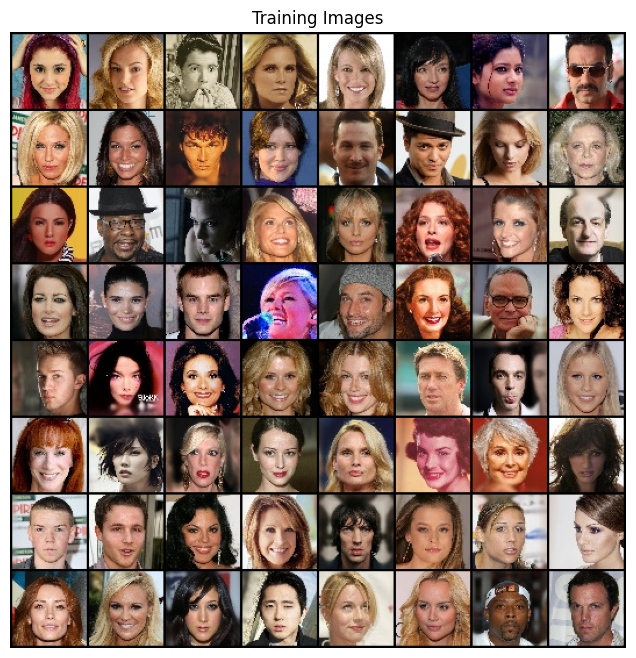

In [5]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

### (b) GAN Implementation


#### 1. Weight Initialization

All model weights in GAN should be randomly initialized from a Normal distribution with `mean = 0`, `stdev = 0.02`. The ``weights_init`` function takes an initialized model as input and reinitializes all convolutional, convolutional-transpose, and batch normalization layers to meet this criteria. This function is applied to the models immediately after initialization.

In [6]:
# custom weights initialization called on netG and netD
def weights_init(m):
  classname = m.__class__.__name__
  if classname.find('Conv') != -1:
    nn.init.normal_(m.weight.data, 0.0, 0.02)
  elif classname.find('BatchNorm') != -1:
    nn.init.normal_(m.weight.data, 1.0, 0.02)
    nn.init.constant_(m.bias.data, 0)

#### 2. Generator

The generator $G$, is designed to map the latent space vector
$z$ to data-space. Since our data are images, converting
$z$ to data-space means ultimately creating an RGB image with the
same size as the training images (i.e. 3x64x64). In practice, this is
accomplished through a series of strided two dimensional convolutional
transpose layers, each paired with a 2D batch norm layer and a relu
activation. The output of the generator is fed through a tanh function
to return it to the input data range of $[-1,1]$.

In [7]:
class Generator(nn.Module):
  def __init__(self):
    super(Generator, self).__init__()
    self.seq = nn.Sequential(
      # the first ConvTranspose2d layer will take the celebA images as input with size of 3x64x64
      # so you will need at least one ConvTranspose2d layer, one BatchNorm2d layer followed by a ReLU activation here
      nn.ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), padding=0, bias=False),
      nn.BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
      nn.ReLU(),
      nn.ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
      nn.BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
      nn.ReLU(),
    # Uncomment these lines and figure out the dimension of the layers
    #   nn.ConvTranspose2d(x1, x2, kernel_size=(k1, k1), stride=(s1, s1), padding=(1, 1), bias=False),
    #   nn.BatchNorm2d(z1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
    #   nn.ReLU(),
    #   nn.ConvTranspose2d(x2, y2, kernel_size=(k2, k2), stride=(s2, s2), padding=(1, 1), bias=False),
    #   nn.BatchNorm2d(z2, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
    #   nn.ReLU(),
      nn.ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
      nn.BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
      nn.ReLU(),
      nn.ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
      nn.BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
      nn.ReLU(),
      nn.ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
      nn.Tanh()
    )

  def forward(self, input):
    x = self.seq(input)
    return x

In [8]:
# Create the generator
netG = Generator().to(device)

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (seq): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU()
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU()
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


#### 3. Discriminator

The discriminator $D$ is a binary classification
network that takes an image as input and outputs a scalar probability
that the input image is real (as opposed to fake). Here, $D$ takes
a 3x64x64 input image, processes it through a series of Conv2d,
BatchNorm2d, and ReLU layers, and outputs the final probability
through a Sigmoid activation function. This architecture can be extended
with more layers if necessary for the problem, but there is significance
to the use of the strided convolution, BatchNorm, and ReLUs.


In [9]:
class Discriminator(nn.Module):
  def __init__(self):
    super(Discriminator, self).__init__()
    # TODO: finish implementing the network architecture
    self.seq = nn.Sequential(
        nn.Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
        nn.ReLU(),
        # nn.Conv2d(x1, y2, kernel_size=(k1, k1), stride=(s1, s1), padding=(1, 1), bias=False),
        # nn.BatchNorm2d(z1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
        # nn.ReLU(),
        # nn.Conv2d(x2, y2, kernel_size=(k2, k2), stride=(s2, s2), padding=(1, 1), bias=False),
        # nn.BatchNorm2d(z2, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
        # nn.ReLU(),
        nn.Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
        nn.BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
        nn.ReLU(),
        nn.Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
        nn.BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
        nn.ReLU(),
        nn.Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
        nn.BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
        nn.ReLU(),
        nn.Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), padding=0, bias=False),
        nn.Sigmoid()
    )

  def forward(self, input):
    x = self.seq(input)
    return x

In [10]:
# Create the Discriminator
netD = Discriminator().to(device)

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (seq): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): ReLU()
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): ReLU()
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): ReLU()
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU()
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


#### Loss Functions and Optimizers

With $D$ and $G$ setup, we can specify how they learn
through the loss functions and optimizers. We will use the Binary Cross
Entropy loss
([`BCELoss`](https://pytorch.org/docs/stable/nn.html#torch.nn.BCELoss))
function which is defined in PyTorch as:

\begin{align}\ell(x, y) = L = \{l_1,\dots,l_N\}^\top, \quad l_n = - \left[ y_n \cdot \log x_n + (1 - y_n) \cdot \log (1 - x_n) \right]\end{align}

Notice how this function provides the calculation of both log components
in the objective function (i.e. $\log(D(x))$ and
$\log(1-D(G(z)))$). We can specify what part of the BCE equation to
use with the $y$ input. This is accomplished in the training loop
which is coming up soon, but it is important to understand how we can
choose which component we wish to calculate just by changing $y$
(i.e. GT labels).

In [11]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

#### 5. Training Loop


Finally, now that we have all of the parts of the GAN framework defined,
we can train it. Be mindful that training GANs is somewhat of an art
form, as incorrect hyperparameter settings lead to mode collapse with
little explanation of what went wrong. Here, we will closely follow
Algorithm 1 from Goodfellow’s paper, while abiding by some of the best
practices shown in [`ganhacks`](https://github.com/soumith/ganhacks).
Namely, we will construct different mini-batches for real and fake
images, and also adjust G’s objective function to maximize
$\log (D(G(z)))$. Training is split up into two main parts. Part 1
updates the Discriminator and Part 2 updates the Generator.

**Part 1: Train the Discriminator**

Recall, the goal of training the discriminator is to maximize the
probability of correctly classifying a given input as real or fake. In
terms of Goodfellow, we wish to “update the discriminator by ascending
its stochastic gradient”. Practically, we want to maximize
$\log(D(x)) + \log(1-D(G(z)))$. Due to the separate mini-batch
suggestion from ganhacks, we will calculate this in two steps. First, we
will construct a batch of real samples from the training set, forward
pass through $D$, calculate the loss ($\log(D(x))$), then
calculate the gradients in a backward pass. Secondly, we will construct
a batch of fake samples with the current generator, forward pass this
batch through $D$, calculate the loss ($\log(1-D(G(z)))$),
and *accumulate* the gradients with a backward pass. Now, with the
gradients accumulated from both the all-real and all-fake batches, we
call a step of the Discriminator’s optimizer.

**Part 2: Train the Generator**

As stated in the original paper, we want to train the Generator by
minimizing $\log(1-D(G(z)))$ in an effort to generate better fakes.
As mentioned, this was shown by Goodfellow to not provide sufficient
gradients, especially early in the learning process. As a fix, we
instead wish to maximize $\log(D(G(z)))$. In the code we accomplish
this by: classifying the Generator output from Part 1 with the
Discriminator, computing G’s loss *using real labels as GT*, computing
G’s gradients in a backward pass, and finally updating G’s parameters
with an optimizer step. It may seem counter-intuitive to use the real
labels as GT labels for the loss function, but this allows us to use the
$\log(x)$ part of the BCELoss (rather than the $\log(1-x)$
part) which is exactly what we want.

Finally, we will do some statistic reporting and at the end of each
epoch we will push our fixed_noise batch through the generator to
visually track the progress of G’s training. The training statistics
reported are:

-  **Loss_D** - discriminator loss calculated as the sum of losses for
   the all real and all fake batches ($\log(D(x)) + \log(D(G(z)))$).
-  **Loss_G** - generator loss calculated as $\log(D(G(z)))$
-  **D(x)** - the average output (across the batch) of the discriminator
   for the all real batch. This should start close to 1 then
   theoretically converge to 0.5 when G gets better. Think about why
   this is.
-  **D(G(z))** - average discriminator outputs for the all fake batch.
   The first number is before D is updated and the second number is
   after D is updated. These numbers should start near 0 and converge to
   0.5 as G gets better. Think about why this is.

**Note:** This step might take a while, depending on how many epochs you
run and if you removed some data from the dataset.



In [12]:
# Training Loop
num_epochs = 30

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ######################################################
        # 1. Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ######################################################

        # Initialize the gradient of D
        netD.zero_grad()

        # 1.1 Calculate the loss with all-real batch

        # Format batch
        real_batch = data[0].to(device)
        b_size = real_batch.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_batch).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        # 1.2 Calculate the loss with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G and a label array
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        # Calculate the mean of output, D_G_z1, from netD with your fake batch
        D_G_z1 = output.mean().item()

        # 1.3 Combine the loss from all-real batch and all-fake batch
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D with step()
        optimizerD.step()

        ######################################################
        # 2. Update G network: maximize log(D(G(z)))
        ######################################################

        # Initialize the gradient of G
        netG.zero_grad()
        # create the label array, remember fake labels are real for generator cost
        label.fill_(real_label)
        # Since we just updated D, perform another forward pass of all-fake batch through D as output
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients using backword() for G's loss
        errG.backward()
        # Calculate the mean of output, D_G_z2, from netD with your fake batch
        D_G_z2 = output.mean().item()
        # Update G with step
        optimizerG.step()
        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/30][0/40]	Loss_D: 1.6795	Loss_G: 10.2747	D(x): 0.5395	D(G(z)): 0.5712 / 0.0001
[1/30][0/40]	Loss_D: 0.0350	Loss_G: 29.5225	D(x): 0.9789	D(G(z)): 0.0000 / 0.0000
[2/30][0/40]	Loss_D: 0.3395	Loss_G: 3.6926	D(x): 0.9146	D(G(z)): 0.1771 / 0.0642
[3/30][0/40]	Loss_D: 1.3240	Loss_G: 6.7952	D(x): 0.8655	D(G(z)): 0.6302 / 0.0026
[4/30][0/40]	Loss_D: 0.8960	Loss_G: 2.2071	D(x): 0.9143	D(G(z)): 0.5043 / 0.1595
[5/30][0/40]	Loss_D: 0.7915	Loss_G: 5.4087	D(x): 0.8718	D(G(z)): 0.4384 / 0.0082
[6/30][0/40]	Loss_D: 0.6707	Loss_G: 4.5416	D(x): 0.7806	D(G(z)): 0.2575 / 0.0183
[7/30][0/40]	Loss_D: 2.1883	Loss_G: 4.3761	D(x): 0.2083	D(G(z)): 0.0070 / 0.0304
[8/30][0/40]	Loss_D: 0.8891	Loss_G: 2.1665	D(x): 0.5755	D(G(z)): 0.1746 / 0.1468
[9/30][0/40]	Loss_D: 2.0920	Loss_G: 3.9005	D(x): 0.2154	D(G(z)): 0.0052 / 0.0460
[10/30][0/40]	Loss_D: 0.8070	Loss_G: 3.0578	D(x): 0.5900	D(G(z)): 0.1045 / 0.0836
[11/30][0/40]	Loss_D: 0.8107	Loss_G: 1.9392	D(x): 0.6430	D(G(z)): 0.1844 / 0.191

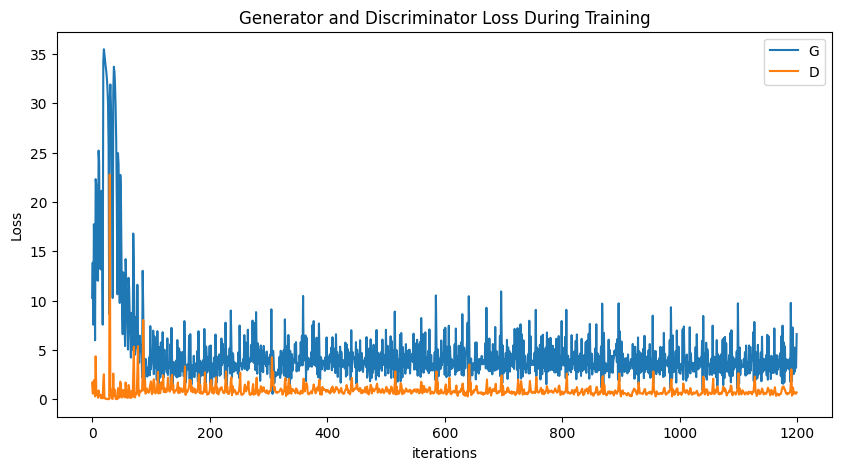

In [13]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

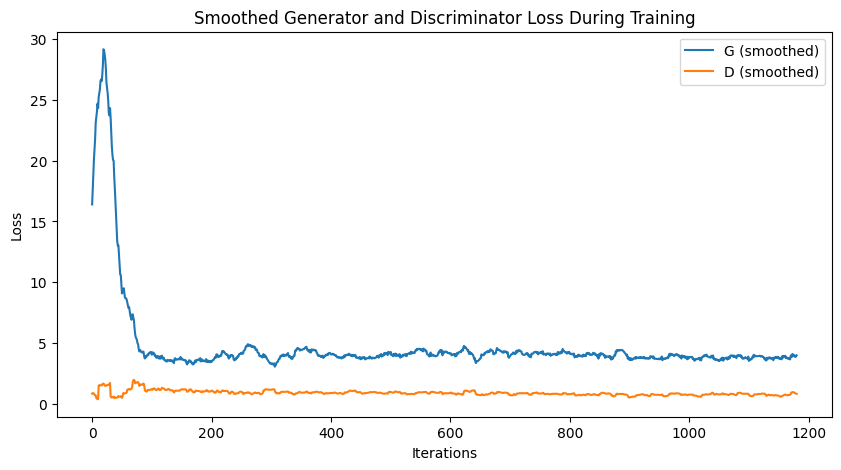

In [14]:
import numpy as np

def moving_average(data, window_size=20):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

G_smooth = moving_average(G_losses)
D_smooth = moving_average(D_losses)

plt.figure(figsize=(10,5))
plt.title("Smoothed Generator and Discriminator Loss During Training")
plt.plot(G_smooth, label="G (smoothed)")
plt.plot(D_smooth, label="D (smoothed)")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

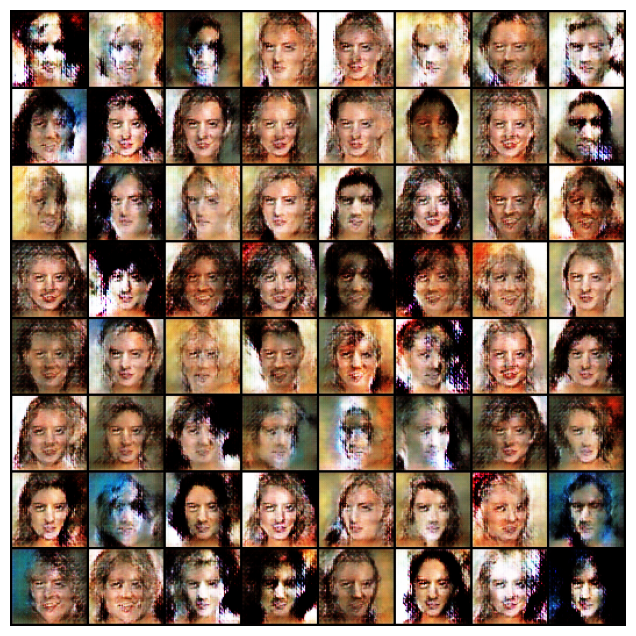

In [15]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

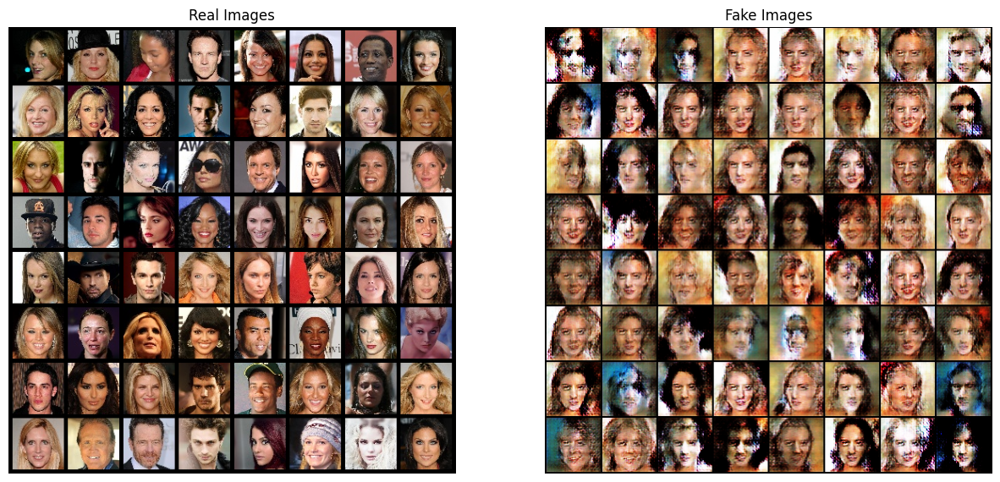

In [16]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

## 2-(c) Custom Dataset: Pokémon Generation One

Train the same DCGAN on a custom dataset and save outputs for your PDF (dataset info, config, ≥64 fake samples).

In [ ]:
import os
import kagglehub
from PIL import Image

# Download Pokémon Generation One (Kaggle: thedagger/pokemon-generation-one)
pokemon_root_path = kagglehub.dataset_download("thedagger/pokemon-generation-one")
dataroot_p2c = os.path.join(pokemon_root_path, "dataset")  # one subfolder per Pokémon species

# Dataset statistics for your PDF
p2c_classes = sorted([d for d in os.listdir(dataroot_p2c) if os.path.isdir(os.path.join(dataroot_p2c, d))])
p2c_num_images = sum(
    len([f for f in os.listdir(os.path.join(dataroot_p2c, c))
         if f.lower().endswith((".png", ".jpg", ".jpeg"))])
    for c in p2c_classes
)
sample_img = Image.open(next(
    os.path.join(dataroot_p2c, p2c_classes[0], f)
    for f in os.listdir(os.path.join(dataroot_p2c, p2c_classes[0]))
    if f.lower().endswith((".png", ".jpg", ".jpeg"))
))

print("=== 2-(c) Dataset info (copy to PDF) ===")
print("Source: Kaggle — thedagger/pokemon-generation-one")
print("URL: https://www.kaggle.com/datasets/thedagger/pokemon-generation-one")
print("Classes (Pokémon species):", len(p2c_classes))
print("Total images:", p2c_num_images)
print("Example original resolution:", sample_img.size, "(W x H); varies per image")
print("Training resolution: {}x{} RGB".format(image_size, image_size))
print("Data path:", dataroot_p2c)

Using Colab cache for faster access to the 'pokemon-generation-one' dataset.
=== 2-(c) Dataset info (copy to PDF) ===
Source: Kaggle — thedagger/pokemon-generation-one
URL: https://www.kaggle.com/datasets/thedagger/pokemon-generation-one
Classes (Pokémon species): 150
Total images: 10657
Example original resolution: (300, 300) (W x H); varies per image
Training resolution: 64x64 RGB
Data path: /kaggle/input/pokemon-generation-one/dataset


=== 2-(c) GAN config (copy to PDF) ===
  dataset: Pokémon Generation One
  image_size: 64
  nc: 3
  nz: 100
  batch_size: 64
  lr: 0.0005
  beta1: 0.5
  num_epochs: 10
  optimizer: Adam
  loss: BCELoss
  architecture: DCGAN (same Generator / Discriminator as 2-a)


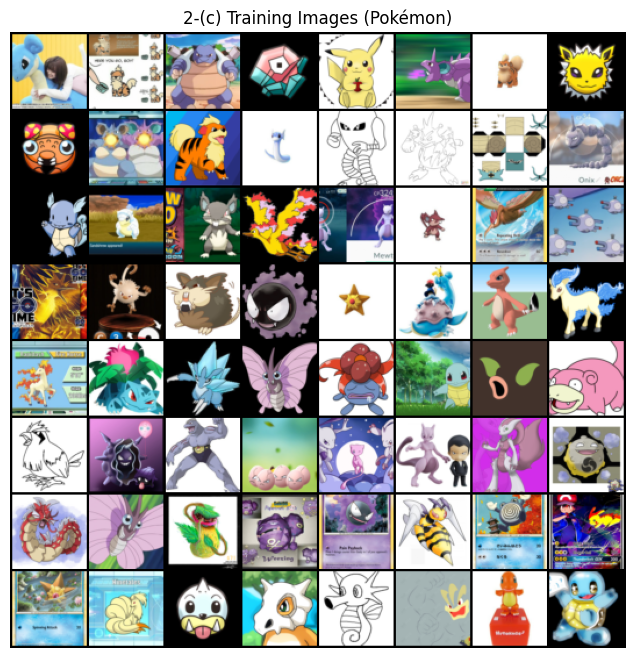

In [ ]:
# 2-(c) GAN configuration
p2c_batch_size = 64
p2c_num_epochs = 10
p2c_config = {
    "dataset": "Pokémon Generation One",
    "image_size": image_size,
    "nc": nc,
    "nz": nz,
    "batch_size": p2c_batch_size,
    "lr": lr,
    "beta1": beta1,
    "num_epochs": p2c_num_epochs,
    "optimizer": "Adam",
    "loss": "BCELoss",
    "architecture": "DCGAN (same Generator / Discriminator as 2-a)",
}
print("=== 2-(c) GAN config (copy to PDF) ===")
for k, v in p2c_config.items():
    print(f"  {k}: {v}")

dataset_p2c = dset.ImageFolder(
    root=dataroot_p2c,
    transform=transforms.Compose([
        transforms.Resize(image_size),
        transforms.CenterCrop(image_size),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ]),
)
dataloader_p2c = torch.utils.data.DataLoader(
    dataset_p2c, batch_size=p2c_batch_size, shuffle=True, num_workers=workers
)

real_batch_p2c = next(iter(dataloader_p2c))
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.title("2-(c) Training Images (Pokémon)")
plt.imshow(np.transpose(
    vutils.make_grid(real_batch_p2c[0][:64], padding=2, normalize=True).cpu(),
    (1, 2, 0),
))
plt.show()

In [ ]:
# Fresh models for 2-(c) — do not reuse CelebA-trained weights
netG_p2c = Generator().to(device)
netG_p2c.apply(weights_init)
netD_p2c = Discriminator().to(device)
netD_p2c.apply(weights_init)

criterion_p2c = nn.BCELoss()
fixed_noise_p2c = torch.randn(64, nz, 1, 1, device=device)
real_label_p2c = 1.0
fake_label_p2c = 0.0
optimizerD_p2c = optim.Adam(netD_p2c.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG_p2c = optim.Adam(netG_p2c.parameters(), lr=lr, betas=(beta1, 0.999))

print(netG_p2c)
print(netD_p2c)

Generator(
  (seq): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU()
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU()
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)
Discriminator(
  (seq): Sequential(
    (0): Conv

In [ ]:
# 2-(c) Training loop
img_list_p2c = []
G_losses_p2c = []
D_losses_p2c = []
iters_p2c = 0

print("Starting 2-(c) training on Pokémon...")
for epoch in range(p2c_num_epochs):
    for i, data in enumerate(dataloader_p2c, 0):
        netD_p2c.zero_grad()
        real_batch = data[0].to(device)
        b_size = real_batch.size(0)
        label = torch.full((b_size,), real_label_p2c, dtype=torch.float, device=device)

        output = netD_p2c(real_batch).view(-1)
        errD_real = criterion_p2c(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG_p2c(noise)
        label.fill_(fake_label_p2c)
        output = netD_p2c(fake.detach()).view(-1)
        errD_fake = criterion_p2c(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()

        errD = errD_real + errD_fake
        optimizerD_p2c.step()

        netG_p2c.zero_grad()
        label.fill_(real_label_p2c)
        output = netD_p2c(fake).view(-1)
        errG = criterion_p2c(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG_p2c.step()

        if i % 50 == 0:
            print("[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f"
                  % (epoch, p2c_num_epochs, i, len(dataloader_p2c),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        G_losses_p2c.append(errG.item())
        D_losses_p2c.append(errD.item())

        if (iters_p2c % 500 == 0) or ((epoch == p2c_num_epochs - 1) and (i == len(dataloader_p2c) - 1)):
            with torch.no_grad():
                snap = netG_p2c(fixed_noise_p2c).detach().cpu()
            img_list_p2c.append(vutils.make_grid(snap, padding=2, normalize=True))

        iters_p2c += 1

print("2-(c) training finished.")

Starting 2-(c) training on Pokémon...
[0/10][0/334]	Loss_D: 2.0208	Loss_G: 15.5040	D(x): 0.7459	D(G(z)): 0.7746 / 0.0000


/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[0/10][50/334]	Loss_D: 0.2611	Loss_G: 4.2079	D(x): 0.8494	D(G(z)): 0.0279 / 0.0214


/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[0/10][100/334]	Loss_D: 0.5098	Loss_G: 3.7170	D(x): 0.9222	D(G(z)): 0.2874 / 0.0365
[0/10][150/334]	Loss_D: 1.1167	Loss_G: 5.7476	D(x): 0.9603	D(G(z)): 0.4630 / 0.0088
[0/10][200/334]	Loss_D: 1.2035	Loss_G: 4.6648	D(x): 0.9657	D(G(z)): 0.4230 / 0.0313
[0/10][250/334]	Loss_D: 0.4966	Loss_G: 4.5520	D(x): 0.9289	D(G(z)): 0.2792 / 0.0188
[0/10][300/334]	Loss_D: 1.1596	Loss_G: 3.5714	D(x): 0.8917	D(G(z)): 0.4769 / 0.0690
[1/10][0/334]	Loss_D: 1.2055	Loss_G: 4.7032	D(x): 0.5226	D(G(z)): 0.0672 / 0.0602
[1/10][50/334]	Loss_D: 1.4300	Loss_G: 4.9860	D(x): 0.6289	D(G(z)): 0.4800 / 0.0179


/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[1/10][100/334]	Loss_D: 0.6066	Loss_G: 3.4897	D(x): 0.7357	D(G(z)): 0.2048 / 0.0446


/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[1/10][150/334]	Loss_D: 1.4912	Loss_G: 1.2665	D(x): 0.3615	D(G(z)): 0.1537 / 0.3584
[1/10][200/334]	Loss_D: 0.6823	Loss_G: 5.5651	D(x): 0.8623	D(G(z)): 0.3646 / 0.0076
[1/10][250/334]	Loss_D: 1.0117	Loss_G: 6.2170	D(x): 0.9143	D(G(z)): 0.4702 / 0.0055
[1/10][300/334]	Loss_D: 0.6295	Loss_G: 1.6316	D(x): 0.6743	D(G(z)): 0.1395 / 0.2398
[2/10][0/334]	Loss_D: 3.5154	Loss_G: 3.9337	D(x): 0.9835	D(G(z)): 0.9209 / 0.0478


/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[2/10][50/334]	Loss_D: 0.9759	Loss_G: 3.1206	D(x): 0.8277	D(G(z)): 0.4906 / 0.0663


/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[2/10][100/334]	Loss_D: 0.4013	Loss_G: 3.2996	D(x): 0.8161	D(G(z)): 0.1469 / 0.0520
[2/10][150/334]	Loss_D: 0.4060	Loss_G: 4.2529	D(x): 0.8974	D(G(z)): 0.2361 / 0.0203
[2/10][200/334]	Loss_D: 0.6587	Loss_G: 3.4381	D(x): 0.8349	D(G(z)): 0.3108 / 0.0612
[2/10][250/334]	Loss_D: 0.4033	Loss_G: 3.1470	D(x): 0.8399	D(G(z)): 0.1708 / 0.0638
[2/10][300/334]	Loss_D: 0.6608	Loss_G: 3.4905	D(x): 0.7397	D(G(z)): 0.2227 / 0.0499
[3/10][0/334]	Loss_D: 1.8070	Loss_G: 2.4462	D(x): 0.7840	D(G(z)): 0.5006 / 0.1528
[3/10][50/334]	Loss_D: 0.4468	Loss_G: 2.7399	D(x): 0.7921	D(G(z)): 0.1416 / 0.1009


/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[3/10][100/334]	Loss_D: 0.8245	Loss_G: 3.9730	D(x): 0.7625	D(G(z)): 0.3466 / 0.0288
[3/10][150/334]	Loss_D: 0.2978	Loss_G: 5.0046	D(x): 0.9452	D(G(z)): 0.1928 / 0.0103
[3/10][200/334]	Loss_D: 1.1072	Loss_G: 3.1165	D(x): 0.7471	D(G(z)): 0.4498 / 0.0748


/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[3/10][250/334]	Loss_D: 1.3388	Loss_G: 1.0624	D(x): 0.4744	D(G(z)): 0.3203 / 0.3936
[3/10][300/334]	Loss_D: 1.0137	Loss_G: 1.4890	D(x): 0.5345	D(G(z)): 0.1934 / 0.2673
[4/10][0/334]	Loss_D: 3.2407	Loss_G: 2.5904	D(x): 0.9722	D(G(z)): 0.8605 / 0.2414
[4/10][50/334]	Loss_D: 0.9274	Loss_G: 2.3243	D(x): 0.5997	D(G(z)): 0.1898 / 0.1428
[4/10][100/334]	Loss_D: 0.7913	Loss_G: 3.9456	D(x): 0.8982	D(G(z)): 0.4461 / 0.0291


/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[4/10][150/334]	Loss_D: 1.7696	Loss_G: 0.9644	D(x): 0.2386	D(G(z)): 0.0356 / 0.4389
[4/10][200/334]	Loss_D: 0.7532	Loss_G: 3.3995	D(x): 0.8575	D(G(z)): 0.3703 / 0.0503
[4/10][250/334]	Loss_D: 0.4880	Loss_G: 3.2019	D(x): 0.7648	D(G(z)): 0.1507 / 0.0638
[4/10][300/334]	Loss_D: 0.6736	Loss_G: 2.4589	D(x): 0.7865	D(G(z)): 0.3014 / 0.1109
[5/10][0/334]	Loss_D: 3.4595	Loss_G: 4.7048	D(x): 0.9824	D(G(z)): 0.8696 / 0.1021


/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[5/10][50/334]	Loss_D: 0.7099	Loss_G: 3.4353	D(x): 0.8491	D(G(z)): 0.3492 / 0.0471
[5/10][100/334]	Loss_D: 0.9766	Loss_G: 1.9601	D(x): 0.6102	D(G(z)): 0.2765 / 0.1769
[5/10][150/334]	Loss_D: 0.5165	Loss_G: 3.2068	D(x): 0.9328	D(G(z)): 0.3104 / 0.0692
[5/10][200/334]	Loss_D: 0.8103	Loss_G: 2.6637	D(x): 0.5165	D(G(z)): 0.0323 / 0.1296
[5/10][250/334]	Loss_D: 0.5130	Loss_G: 3.4741	D(x): 0.8948	D(G(z)): 0.2882 / 0.0450
[5/10][300/334]	Loss_D: 1.0974	Loss_G: 1.1615	D(x): 0.4898	D(G(z)): 0.1593 / 0.3729
[6/10][0/334]	Loss_D: 7.4563	Loss_G: 3.0999	D(x): 0.9989	D(G(z)): 0.9965 / 0.1103


/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[6/10][50/334]	Loss_D: 1.1890	Loss_G: 4.4975	D(x): 0.8483	D(G(z)): 0.5842 / 0.0154
[6/10][100/334]	Loss_D: 1.3389	Loss_G: 1.4884	D(x): 0.4098	D(G(z)): 0.0648 / 0.3540
[6/10][150/334]	Loss_D: 0.6464	Loss_G: 3.6285	D(x): 0.6047	D(G(z)): 0.0450 / 0.0532
[6/10][200/334]	Loss_D: 0.6356	Loss_G: 3.9336	D(x): 0.7807	D(G(z)): 0.2766 / 0.0278
[6/10][250/334]	Loss_D: 0.2853	Loss_G: 3.2442	D(x): 0.8242	D(G(z)): 0.0619 / 0.0704
[6/10][300/334]	Loss_D: 1.0898	Loss_G: 4.5887	D(x): 0.8722	D(G(z)): 0.5043 / 0.0252
[7/10][0/334]	Loss_D: 3.9396	Loss_G: 7.8967	D(x): 0.9971	D(G(z)): 0.9546 / 0.0033


/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[7/10][50/334]	Loss_D: 1.9486	Loss_G: 0.9664	D(x): 0.2388	D(G(z)): 0.0149 / 0.5214
[7/10][100/334]	Loss_D: 0.3958	Loss_G: 3.4500	D(x): 0.8522	D(G(z)): 0.1679 / 0.0520
[7/10][150/334]	Loss_D: 1.1986	Loss_G: 7.9175	D(x): 0.9664	D(G(z)): 0.5913 / 0.0007
[7/10][200/334]	Loss_D: 0.3083	Loss_G: 2.8603	D(x): 0.8557	D(G(z)): 0.0888 / 0.1007
[7/10][250/334]	Loss_D: 0.9929	Loss_G: 2.0765	D(x): 0.4636	D(G(z)): 0.0305 / 0.1904
[7/10][300/334]	Loss_D: 0.6613	Loss_G: 2.5939	D(x): 0.7511	D(G(z)): 0.2466 / 0.1003
[8/10][0/334]	Loss_D: 3.7973	Loss_G: 6.8673	D(x): 0.9816	D(G(z)): 0.8958 / 0.0260
[8/10][50/334]	Loss_D: 0.5453	Loss_G: 4.3314	D(x): 0.9105	D(G(z)): 0.3246 / 0.0222
[8/10][100/334]	Loss_D: 0.3781	Loss_G: 4.2072	D(x): 0.7511	D(G(z)): 0.0480 / 0.0336


/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[8/10][150/334]	Loss_D: 0.3741	Loss_G: 3.4244	D(x): 0.7828	D(G(z)): 0.0868 / 0.0597


/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[8/10][200/334]	Loss_D: 0.6599	Loss_G: 4.1767	D(x): 0.9102	D(G(z)): 0.3731 / 0.0278
[8/10][250/334]	Loss_D: 0.3903	Loss_G: 3.0584	D(x): 0.7689	D(G(z)): 0.0802 / 0.0827
[8/10][300/334]	Loss_D: 0.3872	Loss_G: 3.4458	D(x): 0.9117	D(G(z)): 0.2165 / 0.0499


/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[9/10][0/334]	Loss_D: 5.7445	Loss_G: 3.6844	D(x): 0.9981	D(G(z)): 0.9881 / 0.1047
[9/10][50/334]	Loss_D: 0.5303	Loss_G: 2.8853	D(x): 0.7563	D(G(z)): 0.1608 / 0.0907
[9/10][100/334]	Loss_D: 0.5157	Loss_G: 2.5663	D(x): 0.6668	D(G(z)): 0.0521 / 0.1079
[9/10][150/334]	Loss_D: 0.4084	Loss_G: 2.7435	D(x): 0.8667	D(G(z)): 0.1984 / 0.0998
[9/10][200/334]	Loss_D: 0.4041	Loss_G: 1.9265	D(x): 0.8100	D(G(z)): 0.1231 / 0.2087


/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[9/10][250/334]	Loss_D: 1.4565	Loss_G: 1.0000	D(x): 0.3382	D(G(z)): 0.0073 / 0.4321
[9/10][300/334]	Loss_D: 0.6929	Loss_G: 1.2398	D(x): 0.5744	D(G(z)): 0.0409 / 0.3757
2-(c) training finished.


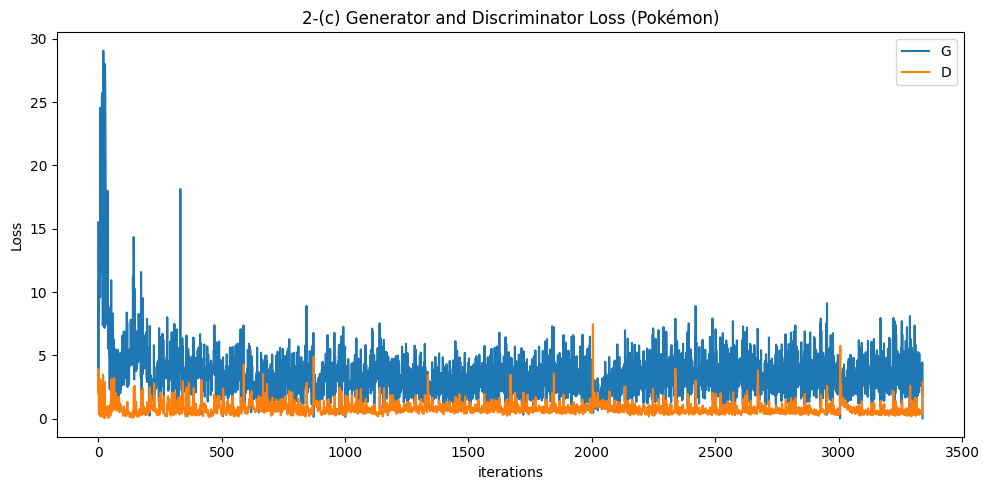

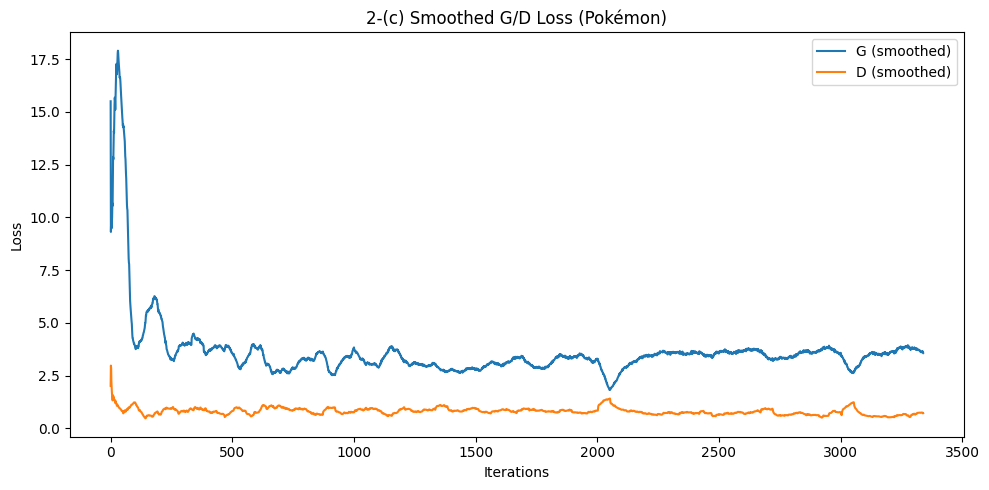

In [ ]:
# 2-(c) Loss curves (save for PDF)
def moving_average(values, window=50):
    smoothed = []
    for i in range(len(values)):
        start = max(0, i - window + 1)
        smoothed.append(sum(values[start:i+1]) / (i - start + 1))
    return smoothed

plt.figure(figsize=(10, 5))
plt.title("2-(c) Generator and Discriminator Loss (Pokémon)")
plt.plot(G_losses_p2c, label="G")
plt.plot(D_losses_p2c, label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.tight_layout()
plt.savefig("p2c_loss.png", dpi=150)
plt.show()

G_smooth_p2c = moving_average(G_losses_p2c)
D_smooth_p2c = moving_average(D_losses_p2c)
plt.figure(figsize=(10, 5))
plt.title("2-(c) Smoothed G/D Loss (Pokémon)")
plt.plot(G_smooth_p2c, label="G (smoothed)")
plt.plot(D_smooth_p2c, label="D (smoothed)")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.tight_layout()
plt.savefig("p2c_loss_smoothed.png", dpi=150)
plt.show()

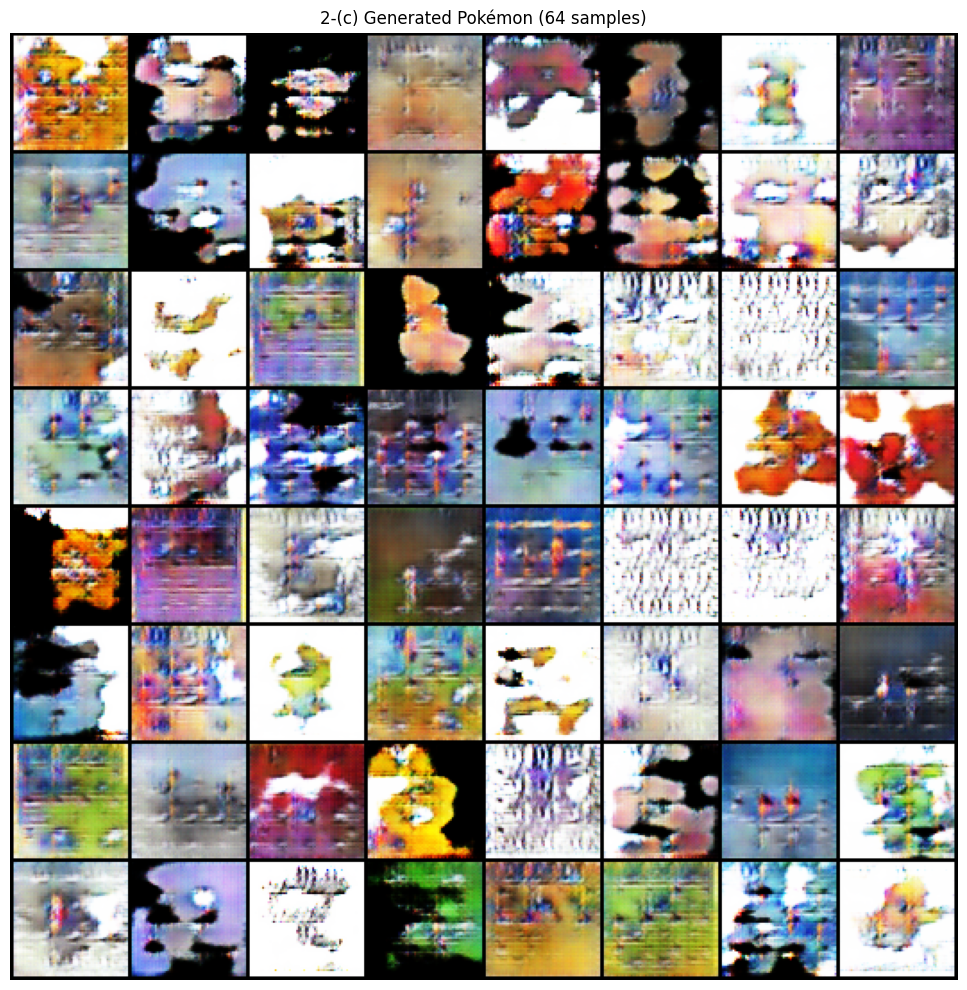

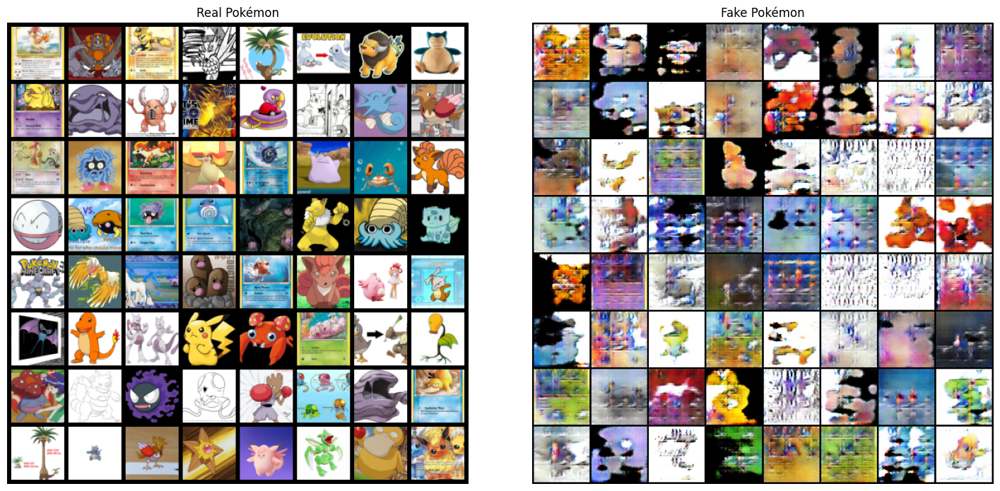

In [ ]:
# 2-(c) ≥64 fake Pokémon samples (save for PDF)
plt.figure(figsize=(10, 10))
plt.axis("off")
plt.title("2-(c) Generated Pokémon (64 samples)")
plt.imshow(np.transpose(img_list_p2c[-1], (1, 2, 0)))
plt.tight_layout()
plt.savefig("p2c_fake_samples.png", dpi=150)
plt.show()

# Real vs fake comparison
real_batch_p2c = next(iter(dataloader_p2c))
plt.figure(figsize=(15, 7))
plt.subplot(1, 2, 1)
plt.axis("off")
plt.title("Real Pokémon")
plt.imshow(np.transpose(
    vutils.make_grid(real_batch_p2c[0][:64], padding=5, normalize=True).cpu(),
    (1, 2, 0),
))
plt.subplot(1, 2, 2)
plt.axis("off")
plt.title("Fake Pokémon")
plt.imshow(np.transpose(img_list_p2c[-1], (1, 2, 0)))
plt.tight_layout()
plt.savefig("p2c_real_vs_fake.png", dpi=150)
plt.show()